In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.cluster import DBSCAN, HDBSCAN
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
import os
from sklearn.preprocessing import MinMaxScaler
import glob

In [114]:
ruta_busqueda = "datos_resultados_union/"
archivos_csv = glob.glob(f"{ruta_busqueda}/*.csv")

In [115]:
archivos_csv

['datos_resultados_union\\datos_gaia_union_0.csv',
 'datos_resultados_union\\datos_gaia_union_1.csv',
 'datos_resultados_union\\datos_gaia_union_2.csv',
 'datos_resultados_union\\datos_gaia_union_3.csv',
 'datos_resultados_union\\datos_gaia_union_4.csv',
 'datos_resultados_union\\datos_gaia_union_5.csv',
 'datos_resultados_union\\datos_gaia_union_6.csv',
 'datos_resultados_union\\datos_gaia_union_7.csv',
 'datos_resultados_union\\datos_gaia_union_8.csv',
 'datos_resultados_union\\datos_gaia_union_9.csv']

In [116]:
lista_dataframes = []
for i in archivos_csv:
    df_temp = pd.read_csv(i, index_col=0)
    lista_dataframes.append(df_temp)
    del df_temp
df = pd.concat(lista_dataframes)

In [117]:
# df = df[df['parallax_error']/df['parallax']<=0.20]
# df = df[df['pmra_error']/df['pmra']<=0.20]
# df = df[df['pmdec_error']/df['pmdec']<=0.20]

In [118]:
df = df[df['probabilidad']>0.5]

In [119]:
# definicion de parametros y modelo a ejecutar
min_pts = 20
max_pts = 1500
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df[['pmra','pmdec','parallax']])
df[['pmra_norm', 'pmdec_norm', 'parallax_norm']] = scaled_data
hdbscan = HDBSCAN(min_cluster_size=min_pts, max_cluster_size=max_pts)
hdbscan.fit(df[['pmra_norm', 'pmdec_norm', 'parallax_norm']])
etiquetas = hdbscan.labels_
df['cluster'] = etiquetas
np.unique(etiquetas, return_counts=True)
dfm = df[df['probabilidad']>0.5]
# Paso 1: Calcular el tamaño de cada cluster
# cluster_sizes = dfm['cluster'].value_counts()

# Paso 2: Filtrar clusters con más de 100 elementos
# top_clusters = cluster_sizes[cluster_sizes > 100].index

top_clusters = dfm['cluster'].value_counts().nlargest(50).index

# Paso 2: Filtrar el DataFrame con esos clusters
dff = dfm[dfm['cluster'].isin(top_clusters)].copy()

# listado de clusters generados
clusters = np.sort(dff['cluster'].unique())
# Crear un colormap con tantos colores como clusters
colormap = cm.get_cmap('Set1', len(top_clusters))  # o 'tab20', 'nipy_spectral', etc.

# Crear un diccionario de colores para cada cluster
color_dict = {cluster: colormap(i) for i, cluster in enumerate(top_clusters)}

# Asignar el color correspondiente a cada fila
dff['color'] = dff['cluster'].map(color_dict)

C:\Users\nicob\AppData\Local\Temp\ipykernel_15392\325238993.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('Set1', len(top_clusters))  # o 'tab20', 'nipy_spectral', etc.


C:\Users\nicob\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


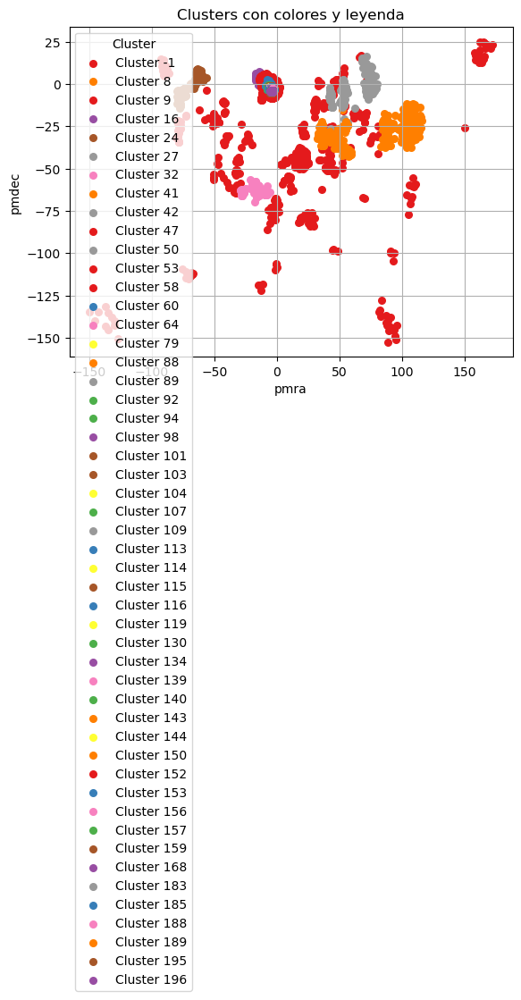

In [120]:
# Dibujar cada cluster por separado para asignar label
for cluster in clusters:
    subset = dff[dff['cluster'] == cluster]
    plt.scatter(subset['pmra'], subset['pmdec'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

plt.xlabel('pmra')
plt.ylabel('pmdec')
plt.title('Clusters con colores y leyenda')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [121]:
df['bp_rp'] = df['phot_bp_mean_mag'] - df['phot_rp_mean_mag']
df['g'] = df['phot_g_mean_mag']
dff['bp_rp'] = dff['phot_bp_mean_mag'] - dff['phot_rp_mean_mag']
dff['g'] = dff['phot_g_mean_mag']

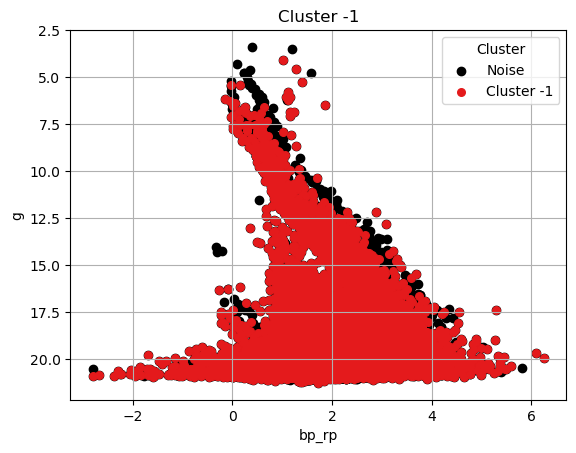

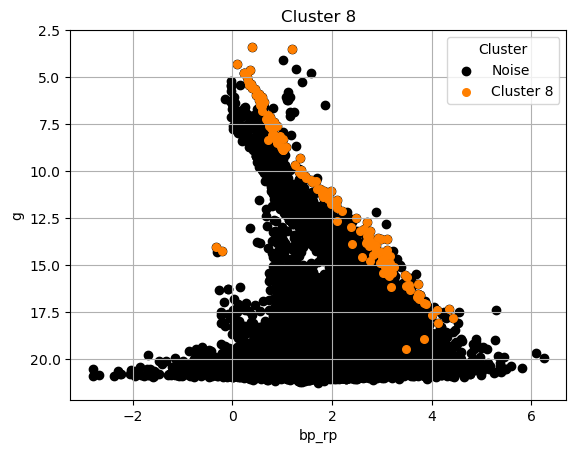

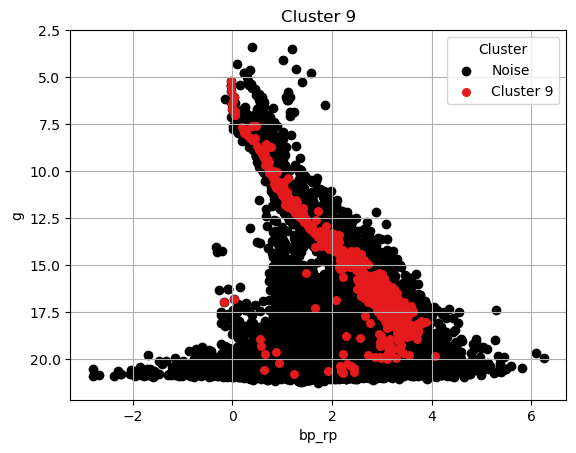

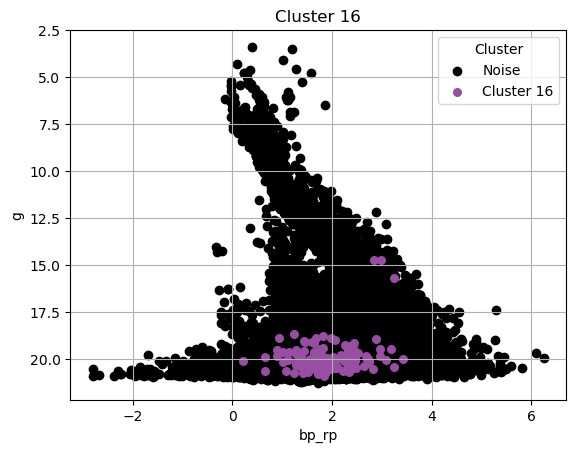

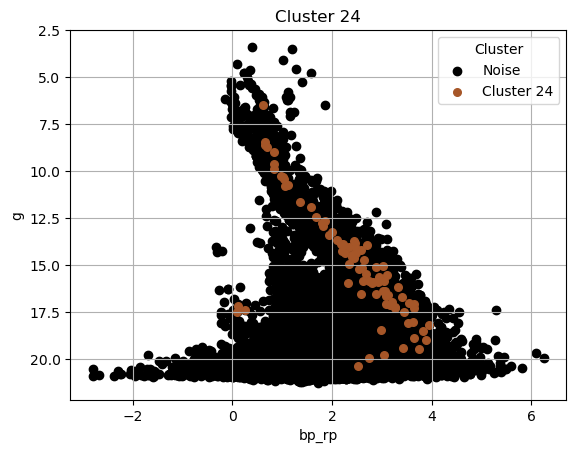

...

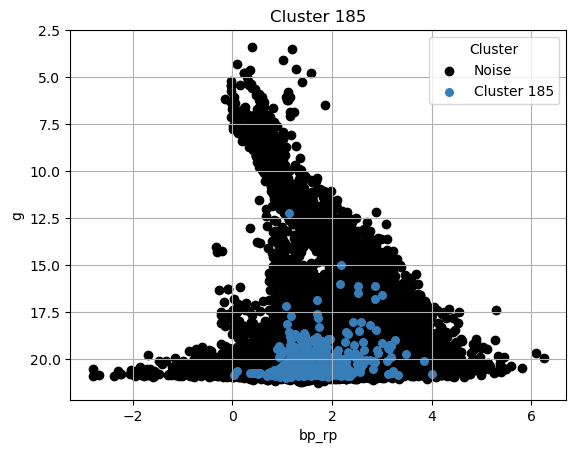

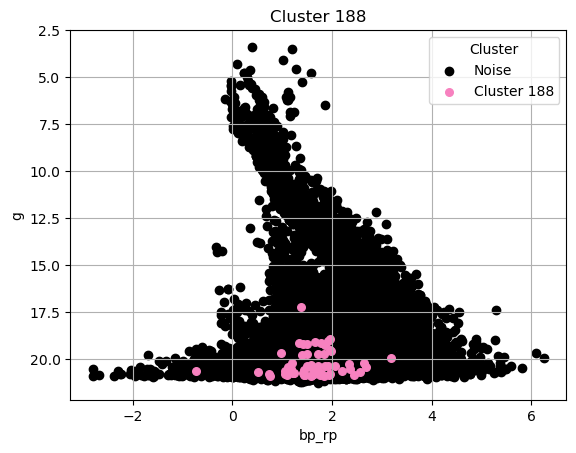

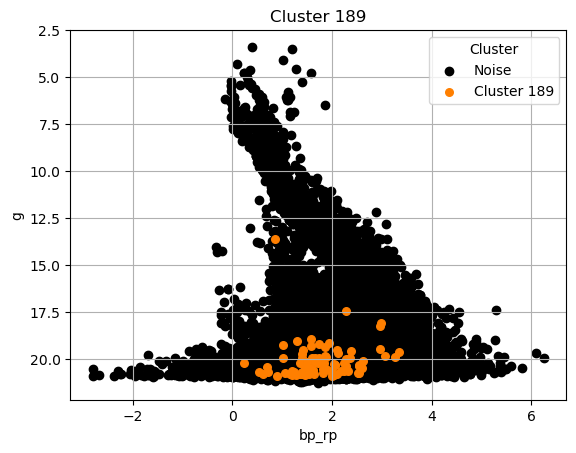

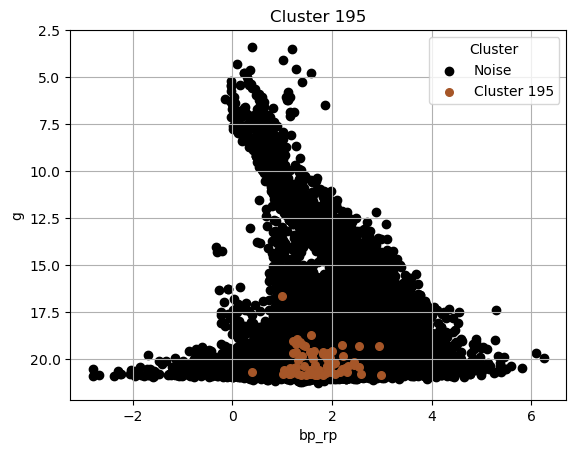

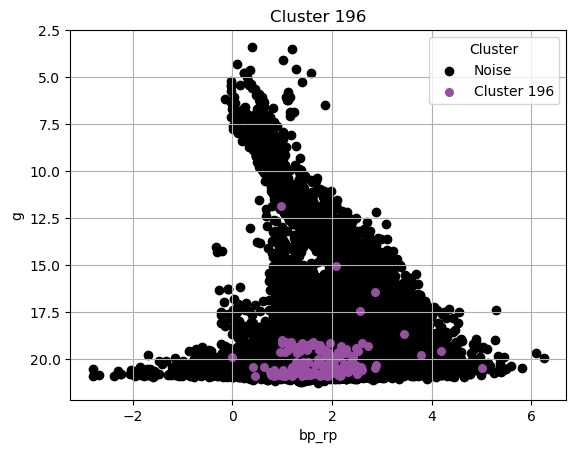

In [122]:
for cluster in clusters:
    subset = dff[dff['cluster'] == cluster]
    plt.scatter(dff['bp_rp'],dff['g'], color='k', label='Noise')
    plt.scatter(subset['bp_rp'], subset['g'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('bp_rp')
    plt.ylabel('g')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.gca().invert_yaxis()
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

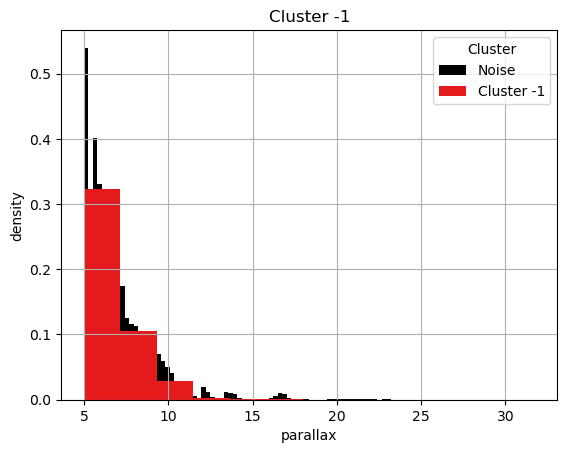

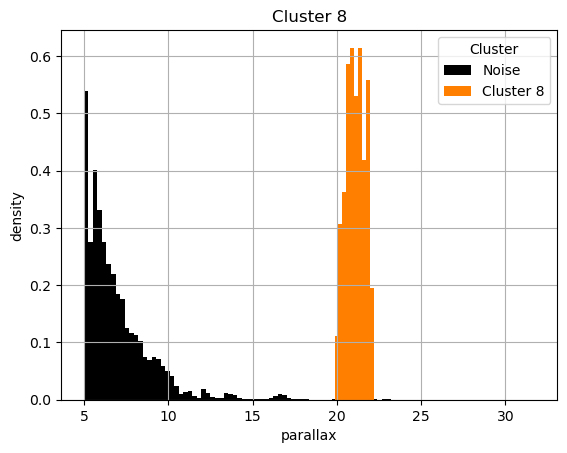

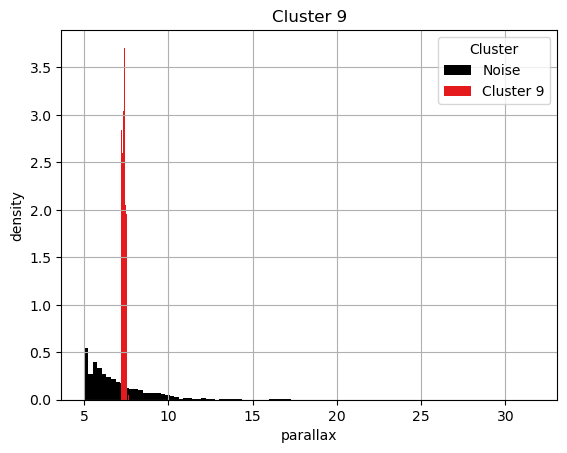

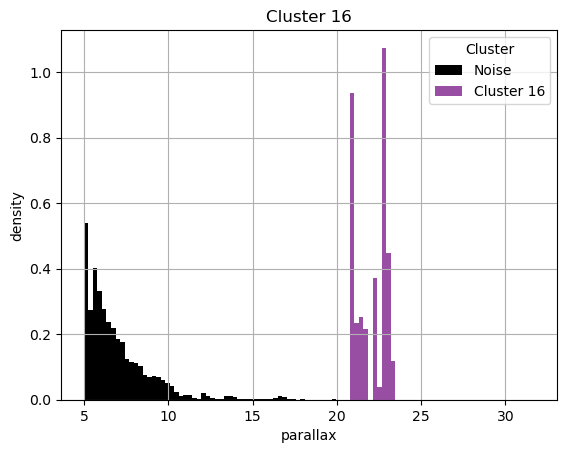

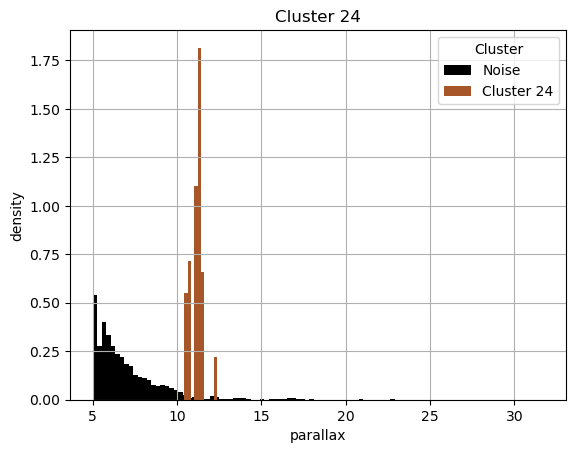

...

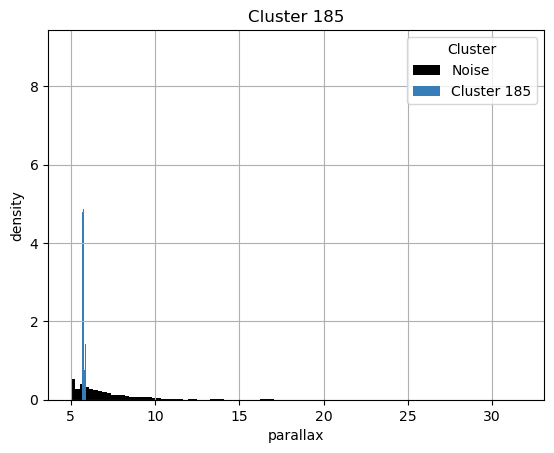

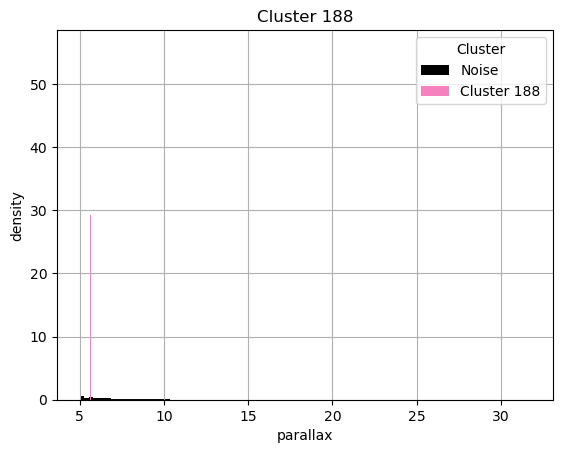

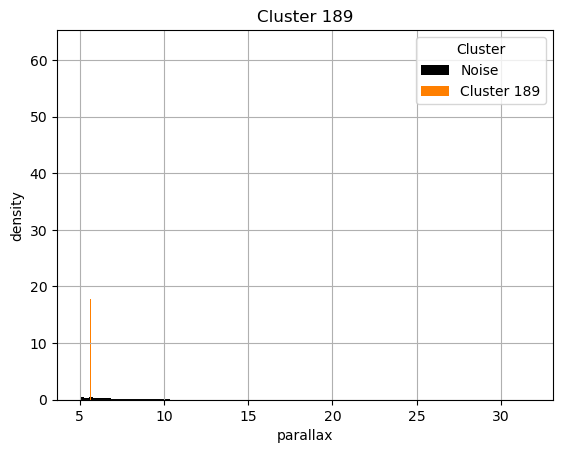

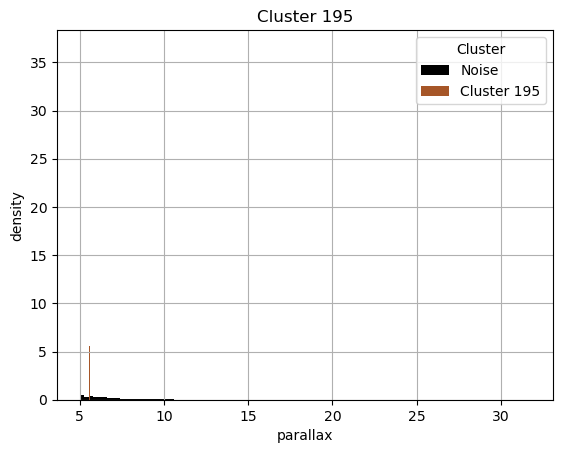

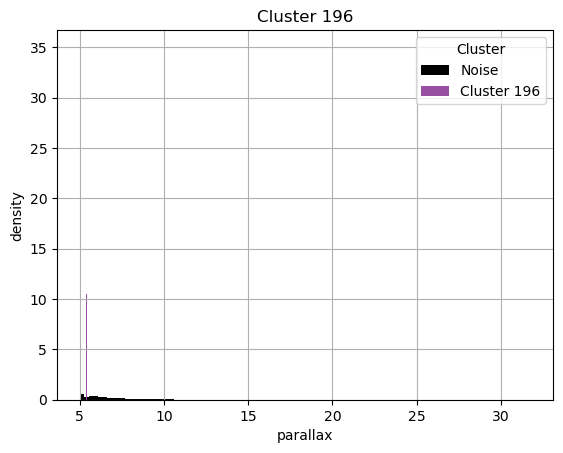

In [123]:
for cluster in clusters:
    subset = dff[dff['cluster'] == cluster]
    plt.hist(df['parallax'], color='k', label='Noise', density=True, bins=100)
    plt.hist(subset['parallax'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}',
                density=True)

    plt.xlabel('parallax')
    plt.ylabel('density')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.grid(True)
    #plt.savefig(f"ruta_imagenes_evolucion/paralajes/parallax_cluster_{cluster}.png")
    plt.show()

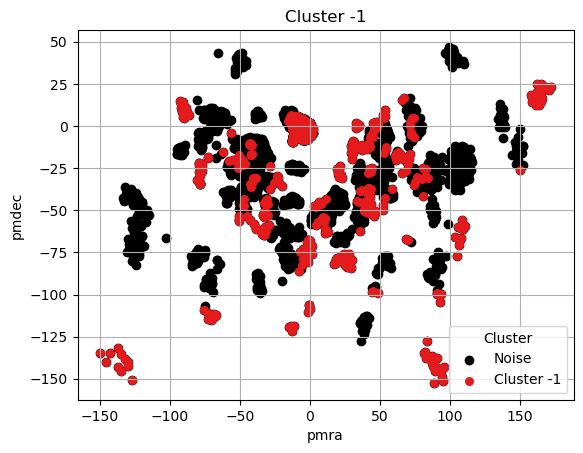

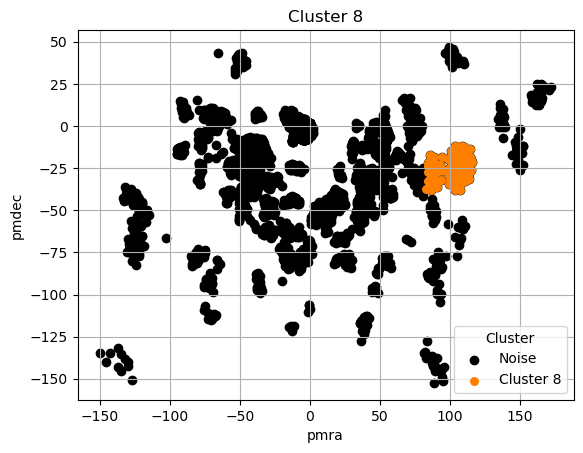

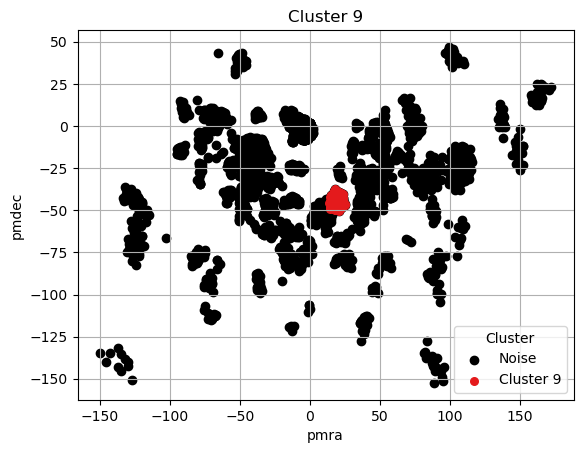

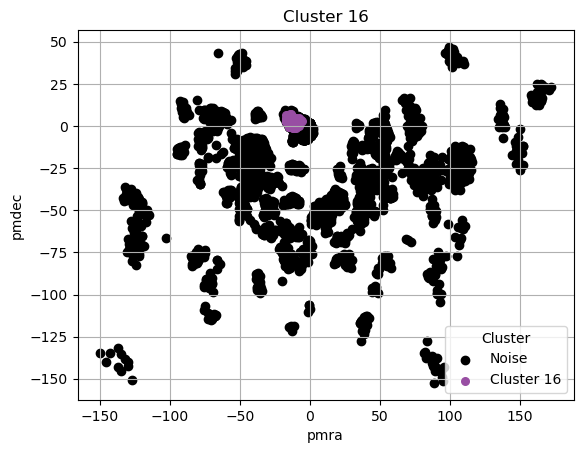

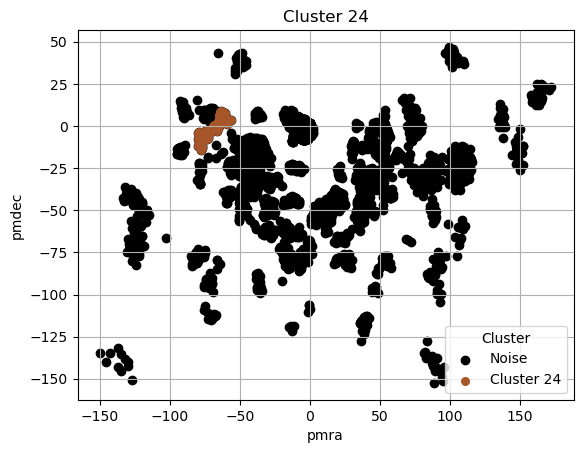

...

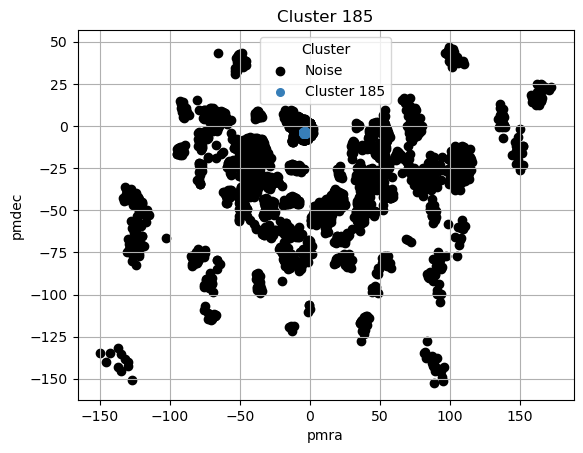

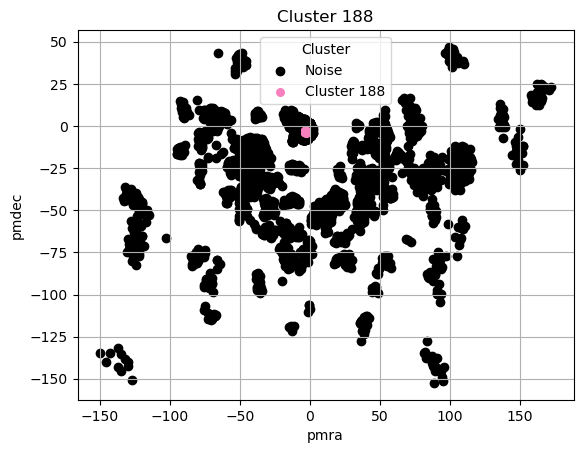

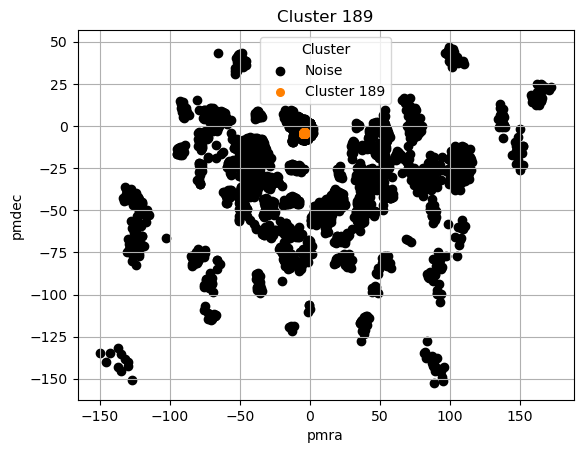

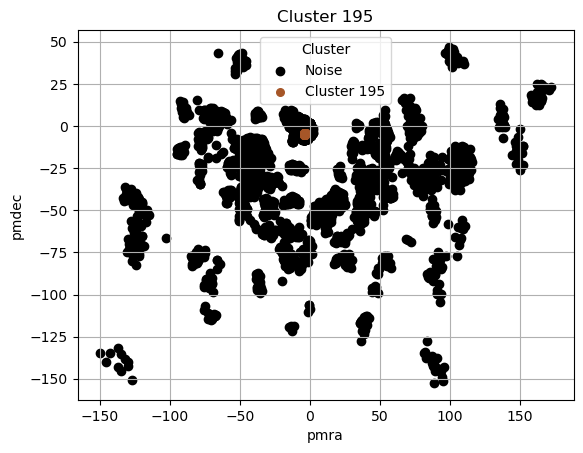

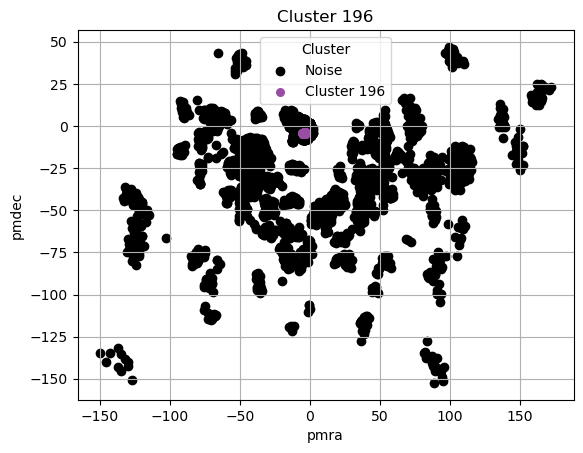

In [124]:
for cluster in clusters:
    subset = dff[dff['cluster'] == cluster]
    plt.scatter(df['pmra'],df['pmdec'], color='k', label='Noise')
    plt.scatter(subset['pmra'], subset['pmdec'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('pmra')
    plt.ylabel('pmdec')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

C:\Users\nicob\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


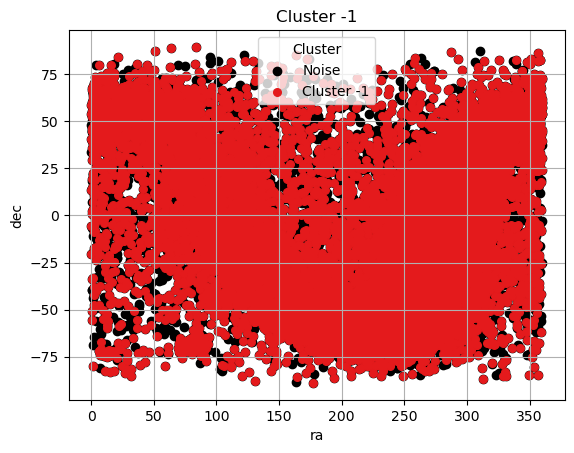

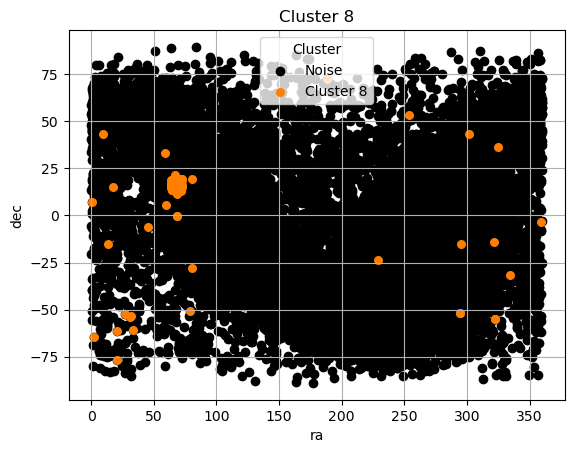

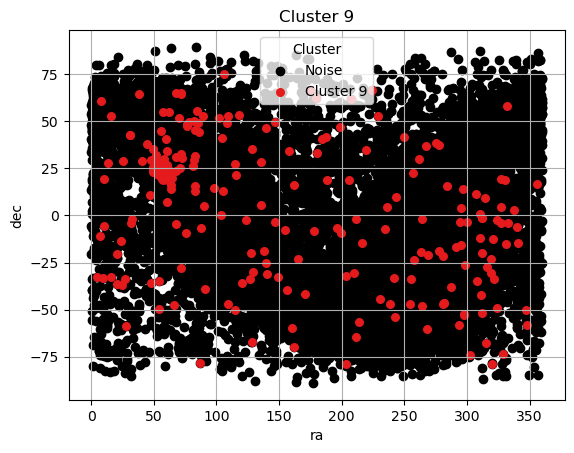

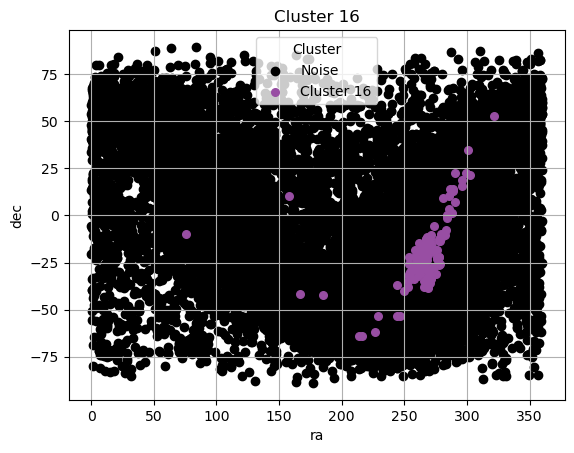

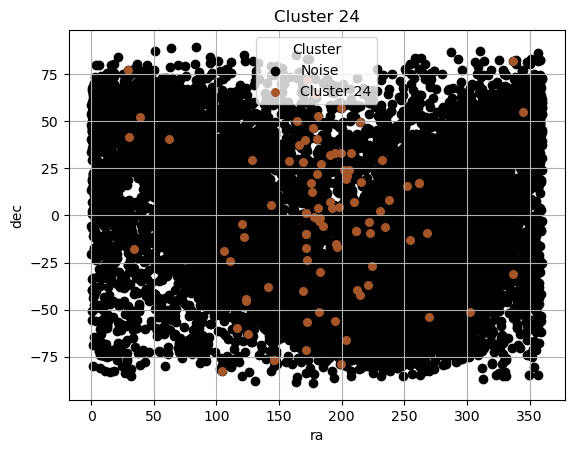

...

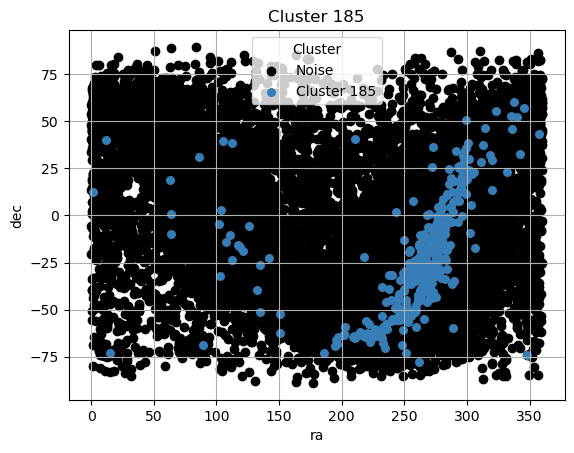

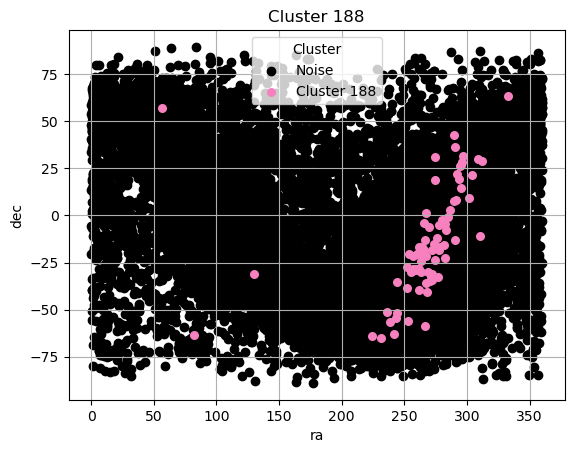

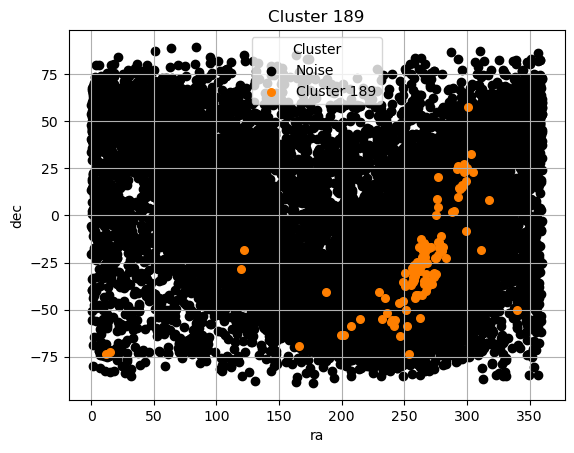

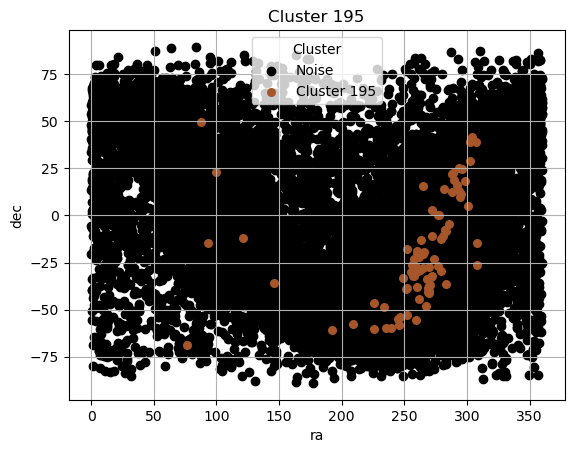

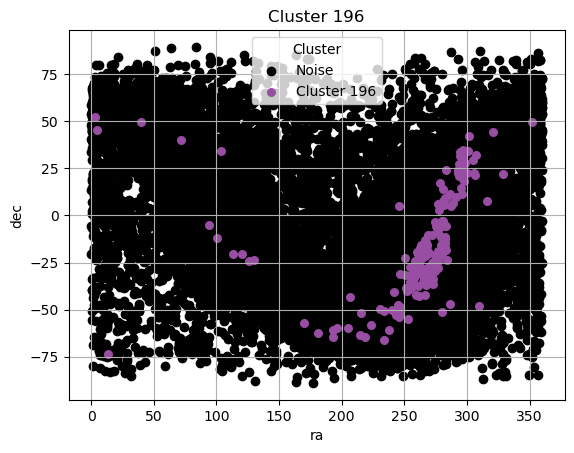

In [125]:
for cluster in clusters:
    subset = dff[dff['cluster'] == cluster]
    plt.scatter(df['ra'],df['dec'], color='k', label='Noise')
    plt.scatter(subset['ra'], subset['dec'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('ra')
    plt.ylabel('dec')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

In [149]:
dfm['cluster'].value_counts()

cluster
-1      128156
 47       1180
 152       913
 9         821
 58        777
         ...  
 30         20
 141        20
 112        20
 108        20
 169        20
Name: count, Length: 200, dtype: int64

In [147]:
df_temp = dff.groupby('cluster').agg({'parallax':'mean','source_id':'count'}).reset_index()
df_temp['distancia'] = 1000/df_temp['parallax']
df_temp

,cluster,parallax,source_id,distancia
0,-1,6.712232,128156,148.981742
1,8,21.105163,154,47.381771
2,9,7.371541,821,135.656852
3,16,22.053123,189,45.345051
4,24,11.160658,92,89.600455
5,27,11.961719,76,83.600023
6,32,11.864898,81,84.282223
7,41,10.690968,162,93.536901
8,42,10.596143,72,94.373960
9,47,16.659538,1180,60.025673


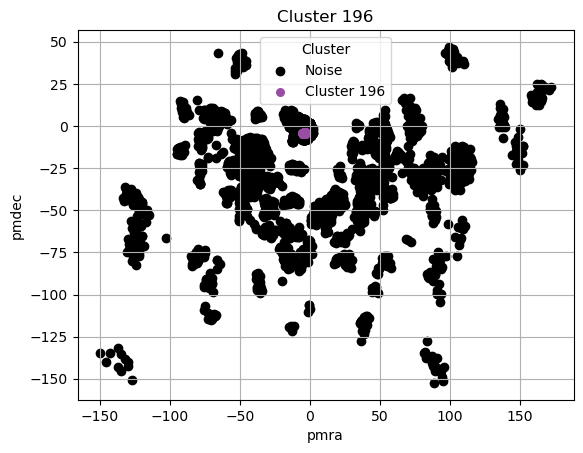

In [151]:
for cluster in [196]:
    subset = dfm[dfm['cluster'] == cluster]
    plt.scatter(df['pmra'],df['pmdec'], color='k', label='Noise')
    plt.scatter(subset['pmra'], subset['pmdec'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('pmra')
    plt.ylabel('pmdec')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

C:\Users\nicob\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


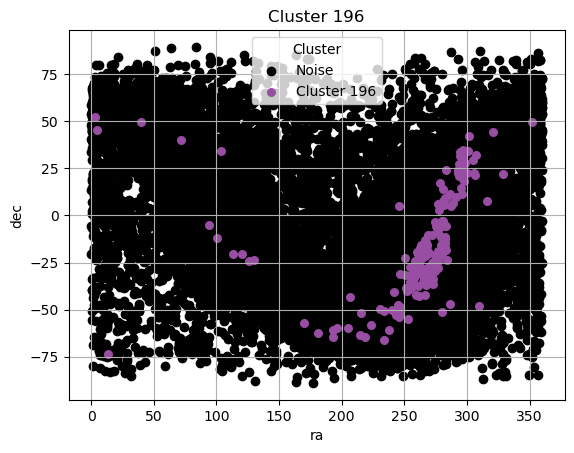

In [153]:
for cluster in [196]:
    subset = dfm[dfm['cluster'] == cluster]
    plt.scatter(df['ra'],df['dec'], color='k', label='Noise')
    plt.scatter(subset['ra'], subset['dec'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('ra')
    plt.ylabel('dec')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

In [167]:
dfm['bp_rp'] = dfm['phot_bp_mean_mag'] - dfm['phot_rp_mean_mag']
dfm['g'] = dfm['phot_g_mean_mag']

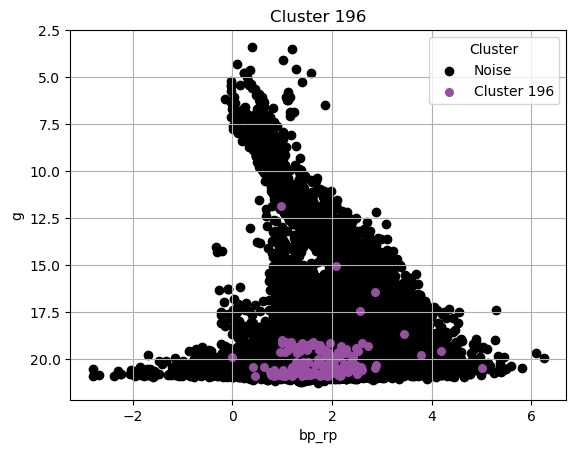

In [169]:
for cluster in [196]:
    subset = dfm[dfm['cluster'] == cluster]
    plt.scatter(dff['bp_rp'],dff['g'], color='k', label='Noise')
    plt.scatter(subset['bp_rp'], subset['g'],
                color=[color_dict[cluster]],
                label=f'Cluster {cluster}', s=30)

    plt.xlabel('bp_rp')
    plt.ylabel('g')
    plt.title(f'Cluster {cluster}')
    plt.legend(title='Cluster')
    plt.gca().invert_yaxis()
    plt.grid(True)
#     plt.savefig(f"ruta_imagenes_evolucion/diagramas_cm/diagrama_cluster_{cluster}.png")
    plt.show()

In [170]:
dfm['cluster'].value_counts()

cluster
-1      128156
 47       1180
 152       913
 9         821
 58        777
         ...  
 30         20
 141        20
 112        20
 108        20
 169        20
Name: count, Length: 200, dtype: int64